In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
from natsort import natsorted
import matplotlib.pyplot as plt
import decoupler as dc

sns.set_context("paper", font_scale=2) # set some nice global plotting settings.

<frozen importlib._bootstrap>:219: RuntimeWarning: scipy._lib.messagestream.MessageStream size changed, may indicate binary incompatibility. Expected 56 from C header, got 64 from PyObject


In [2]:
tissue = 'GonadsFemale'

In [3]:
plate_palette = sns.color_palette("husl", n_colors=3)
sex_palette = ['hotpink','dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']


In [ ]:
adata = sc.read_h5ad(f'../IGVF_analysis/cellbender_tissues/{tissue}_processed_subclustered_res0.2.h5ad')



In [ ]:
adata

In [61]:
adata.obs['plate'].value_counts()

plate
igvf_008b    263354
igvf_008     189748
igvf_007     112757
Name: count, dtype: int64

In [62]:
adata.obs.head()

,lab_sample_id,sample,plate,subpool,SampleType,Tissue,Sex,Age,Genotype,subpool_type,...,total_counts_mt_cb,pct_counts_mt_cb,doublet_score,predicted_doublet,background_fraction,cell_probability,cell_size,droplet_efficiency,leiden,leiden_R
cellID,,,,,,,,,,,,,,,,,,,,,
F7_D10_A1_Subpool_4_igvf_008b,094_CASTJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,CASTJ,NO,...,1412.0,0.948071,0.113703,False,0.000564,0.999955,59862.667969,2.5,25,25
C5_C12_A7_Subpool_4_igvf_008b,030_AJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,AJ,NO,...,1220.0,0.837417,0.128940,False,0.000316,0.999955,58552.738281,2.5,22,22
D1_C12_A12_Subpool_4_igvf_008b,076_PWKJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,PWKJ,NO,...,516.0,0.386358,0.076923,False,0.000479,0.999955,53721.480469,2.5,18,18
E5_G9_B3_Subpool_4_igvf_008b,040_129S1J_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,129S1J,NO,...,46.0,0.036858,0.142857,False,0.000120,0.999955,50204.941406,2.5,35,35
B3_E2_A4_Subpool_4_igvf_008b,068_NODJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,NODJ,NO,...,197.0,0.158519,0.161765,False,0.000531,0.999955,50023.472656,2.5,12,12


In [63]:
adata.var.head()

,gene_id,gene_name,mt,highly_variable,means,dispersions,dispersions_norm
gene_name,,,,,,,
4933401J01Rik,ENSMUSG00000102693.2,4933401J01Rik,False,False,1.552448e-05,1.123133,-1.198795
Gm26206,ENSMUSG00000064842.3,Gm26206,False,False,1.000000e-12,NaN,NaN
Xkr4,ENSMUSG00000051951.6,Xkr4,False,True,2.275799e-01,2.846995,1.220105
Gm18956,ENSMUSG00000102851.2,Gm18956,False,False,8.339441e-05,2.144214,0.233972
Gm37180,ENSMUSG00000103377.2,Gm37180,False,False,4.373935e-03,2.223918,0.345811


In [64]:
def stacked_barplot_proportions(adata, cluster_key, var_key, fsize=(12, 6), annotations=True, reverse_order=False, custom_order=None, custom_colors=None):
    colors = sns.color_palette("husl", n_colors=len(adata[var_key].unique()))

    # Group the data by 'cluster_key' and 'var_key', count occurrences, and calculate proportions
    grouped_data = adata.groupby([cluster_key, var_key]).size().unstack().fillna(0)
    proportions = grouped_data.div(grouped_data.sum(axis=1), axis=0)

    # Apply custom order if provided
    if custom_order:
        proportions = proportions.loc[custom_order]
    if custom_colors:
        colors = custom_colors

    # Reverse the order of the DataFrame if reverse_order is True
    if reverse_order:
        proportions = proportions.iloc[::-1]
        m = adata.groupby([cluster_key]).size().to_frame().iloc[::-1]
    else:
        m = adata.groupby([cluster_key]).size().to_frame()

    #sns.set_style('white')
    # Create the stacked bar plot
    ax = proportions.plot(kind='barh', color=colors, stacked=True, figsize=fsize, width=0.8, edgecolor=None)

    if annotations:
        for i, txt in enumerate(m[0]):
            ax.text(0.875, i, txt, fontsize=14, va='center', transform=ax.get_yaxis_transform())

    plt.xlim(0, 1.15)
    ax.tick_params(axis="x", labelsize=14)
    ax.tick_params(axis="y", labelsize=14)
    ax.set_xlabel("Proportion")
    ax.set_ylabel(cluster_key)
    ax.set_title(f'{var_key} by {cluster_key}')

    if annotations:
        ax.legend(title=var_key, bbox_to_anchor=(1.05, 1), loc='upper left')
    else:
        ax.get_legend().remove()

    ax.grid(False)
    
    plt.show()

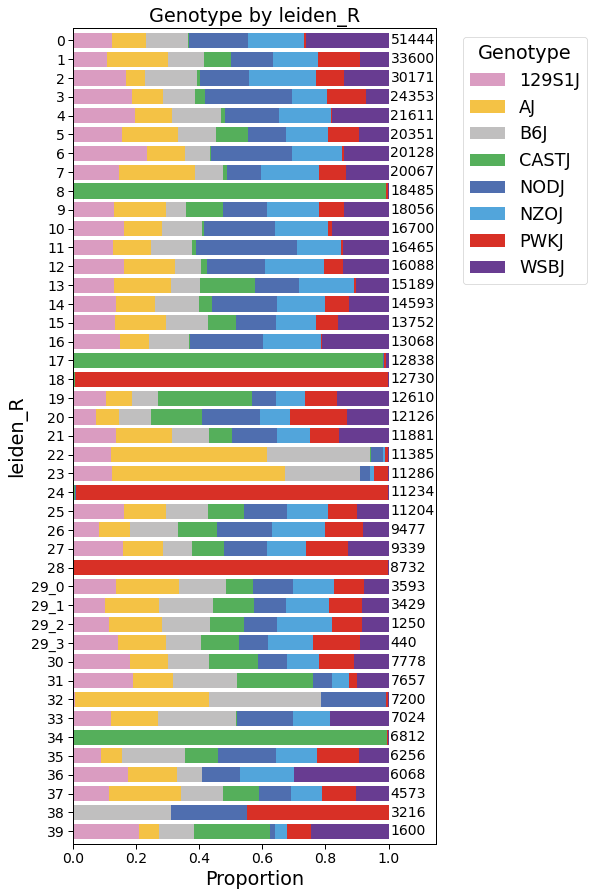

In [65]:
stacked_barplot_proportions(adata.obs, 
                            'leiden_R', 'Genotype',
                            reverse_order = True,
                            fsize = (6.5,15), 
                            custom_colors = geno_palette,
                            annotations = True)


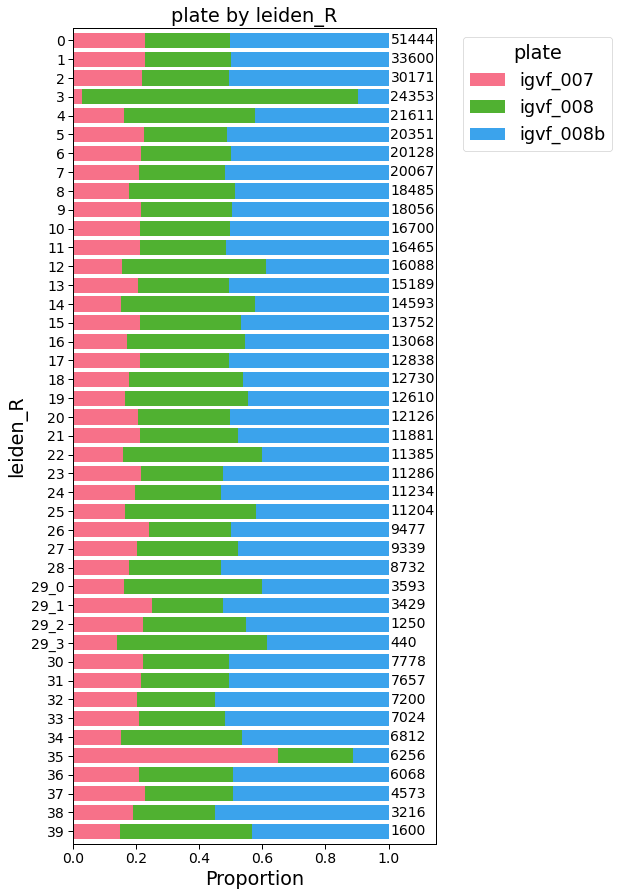

In [66]:
stacked_barplot_proportions(adata.obs, 
                            'leiden_R', 'plate',
                            reverse_order = True,
                            fsize = (6.5,15), 
                            custom_colors = plate_palette,
                            annotations = True)


In [67]:
marker_genes_dict = {
    "Granulosa": ['Inha','Serpine2','Slc18a2','Fshr', 'Nr5a2','Chst8','Fam78a'],
    "Theca": ['Cyp17a1','Aldh1a1','Cyp11a1','Srd5a1','Mgarp'],
    "Secretory_epithelial": ['Ovgp1'],
    "Stromal": ['Pdgfra','Cdh11'],
    "Ciliated_epithelial": ['Foxj1'],
    "Endothelial": ["Flt1","Pecam1","Tek","Kdr"],
    "Surface_epithelium": ['Upk1b','Upk3b','Ildr2'],
    "Luteal": ['Ptgfr','Star'],
    "Smooth_muscle": ["Myh11","Acta2","Myl9","Mfap5"],
    "Immune": ["Adgre1","F13a1"],
    "Lymphatic_endothelial": ['Flt4','Lyve1','Prox1'],
    "Pericyte": ["Pdgfrb","Cspg4","Des","Rgs5"],
    "Fibroblast": ["Dcn","Col15a1","Tnxb"], 
    "Adipocyte": ["Adipoq","Pnpla2"],
}

categories: 0, 1, 2, etc.
var_group_labels: Granulosa, Theca, Secretory_epithelial, etc.


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


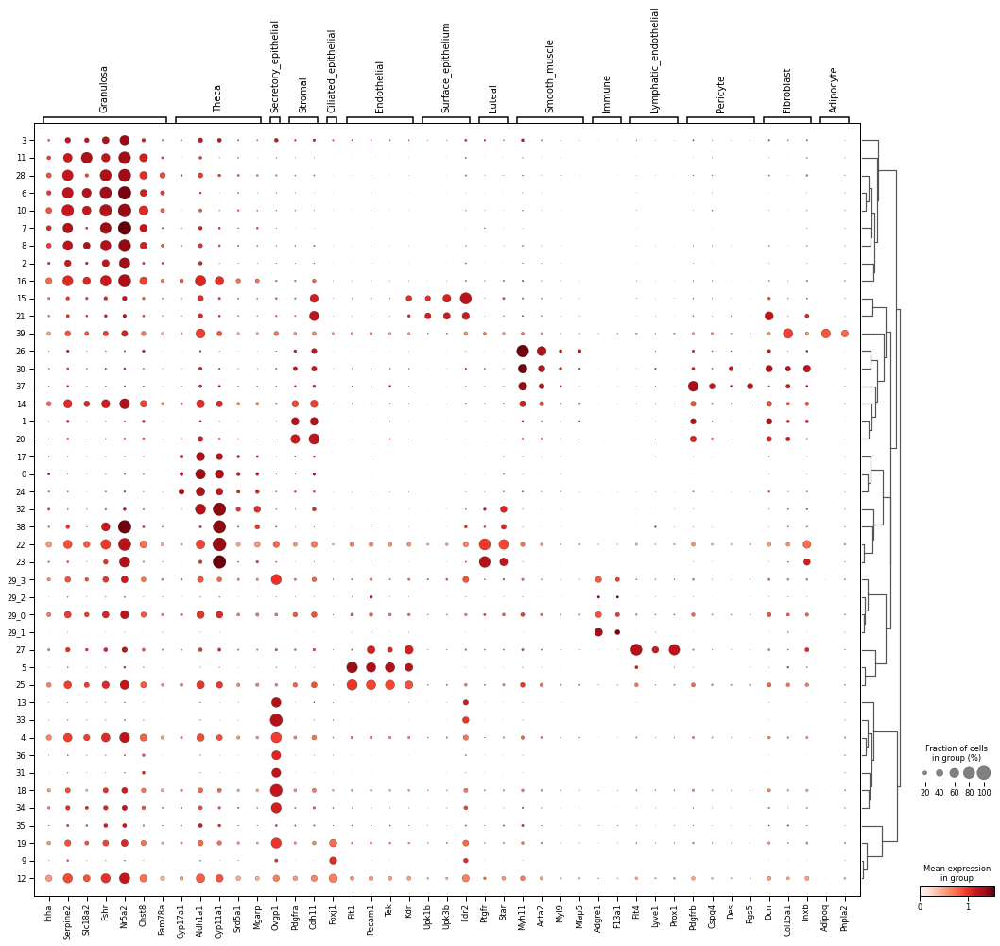

In [68]:
sc.pl.dotplot(adata, marker_genes_dict, 'leiden_R', mean_only_expressed = True,
              dendrogram=True, log=True)


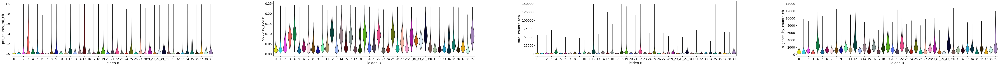

In [69]:
plt.rcParams['figure.figsize'] = (16, 6)

sc.pl.violin(adata, ['pct_counts_mt_cb', 'doublet_score', 'total_counts_raw', 'n_genes_by_counts_cb'],
             groupby = "leiden_R", 
             jitter=0.4, multi_panel=True, size=0)

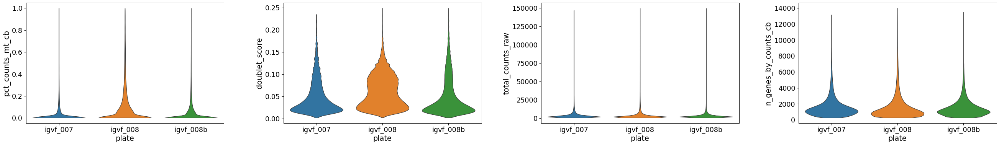

In [70]:
plt.rcParams['figure.figsize'] = (8, 6)

sc.pl.violin(adata, ['pct_counts_mt_cb', 'doublet_score', 'total_counts_raw', 'n_genes_by_counts_cb'],
             groupby = "plate", 
             jitter=0.4, multi_panel=True, size=0)

In [71]:
plt.rcParams['figure.figsize'] = (8, 8)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


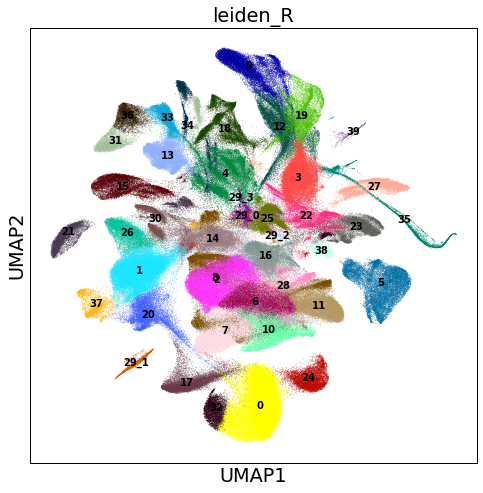

In [72]:
sc.pl.umap(adata, color=['leiden_R'], size=1, legend_fontsize = 10, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


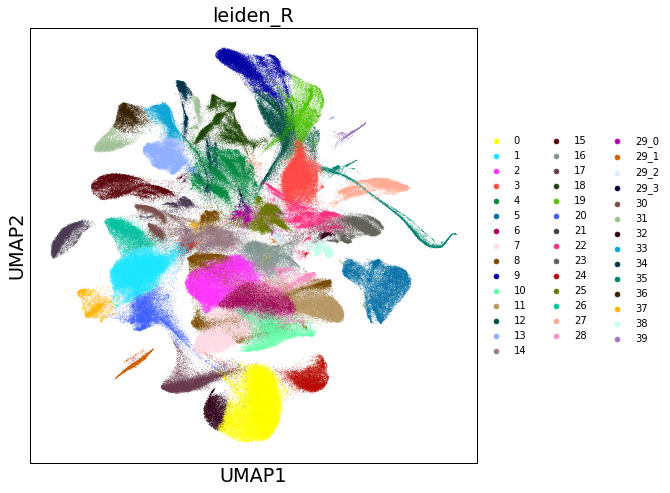

In [73]:
sc.pl.umap(adata, color=['leiden_R'], size=1, legend_fontsize = 10)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


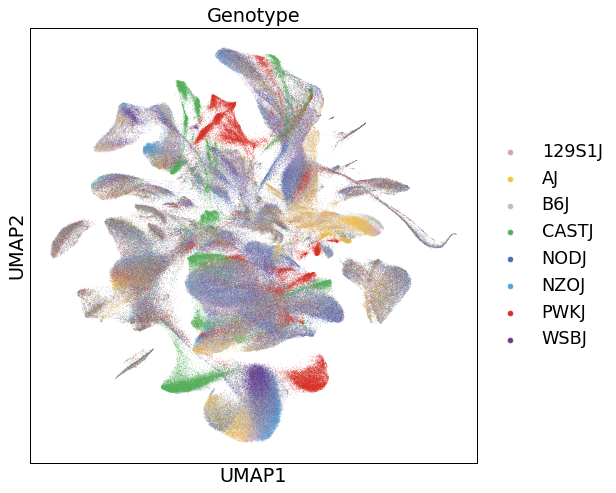

In [74]:
sc.pl.umap(adata, color=['Genotype'], size = 0.8, palette = geno_palette)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


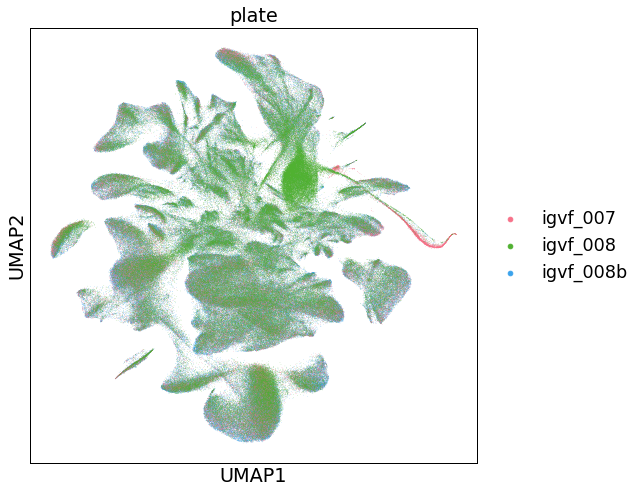

In [75]:
sc.pl.umap(adata, color=['plate'], size = 0.8, palette = plate_palette)


In [76]:
adata

AnnData object with n_obs × n_vars = 565859 × 56953
    obs: 'lab_sample_id', 'sample', 'plate', 'subpool', 'SampleType', 'Tissue', 'Sex', 'Age', 'Genotype', 'subpool_type', 'Protocol', 'Chemistry', 'bc', 'bc1_sequence', 'bc2_sequence', 'bc3_sequence', 'bc1_well', 'bc2_well', 'bc3_well', 'Row', 'Column', 'well_type', 'Mouse_Tissue_ID', 'Multiplexed_sample1', 'Multiplexed_sample2', 'DOB', 'Age_days', 'Body_weight_g', 'Estrus_cycle', 'Dissection_date', 'Dissection_time', 'ZT', 'Dissector', 'Tissue_weight_mg', 'Notes', 'n_genes_by_counts_raw', 'total_counts_raw', 'total_counts_mt_raw', 'pct_counts_mt_raw', 'n_genes_by_counts_cb', 'total_counts_cb', 'total_counts_mt_cb', 'pct_counts_mt_cb', 'doublet_score', 'predicted_doublet', 'background_fraction', 'cell_probability', 'cell_size', 'droplet_efficiency', 'leiden', 'leiden_R'
    var: 'gene_id', 'gene_name', 'mt', 'highly_variable', 'means', 'dispersions', 'dispersions_norm'
    uns: 'hvg', 'leiden', 'leiden_R', 'log1p', 'neighbors', 'umap'

In [77]:
plt.rcParams['figure.figsize'] = (8, 8)


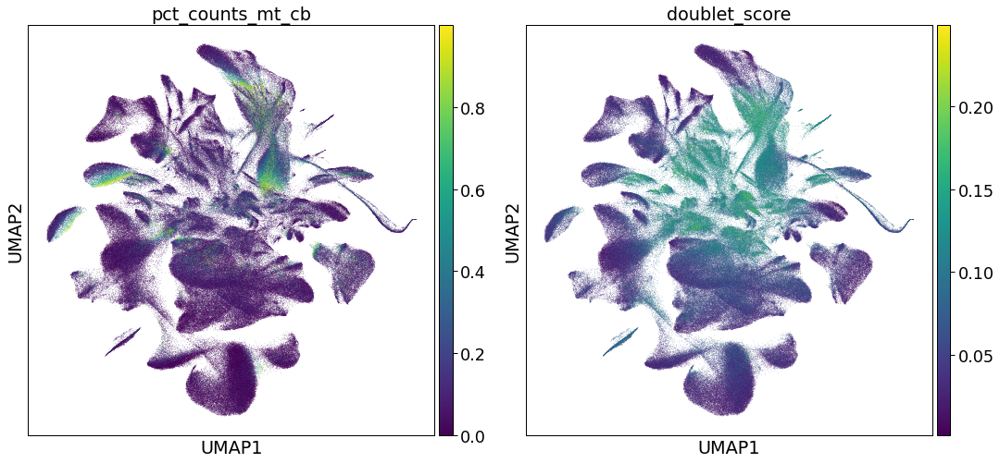

In [78]:
sc.pl.umap(adata, color=['pct_counts_mt_cb','doublet_score'], size = 0.8, palette = plate_palette)


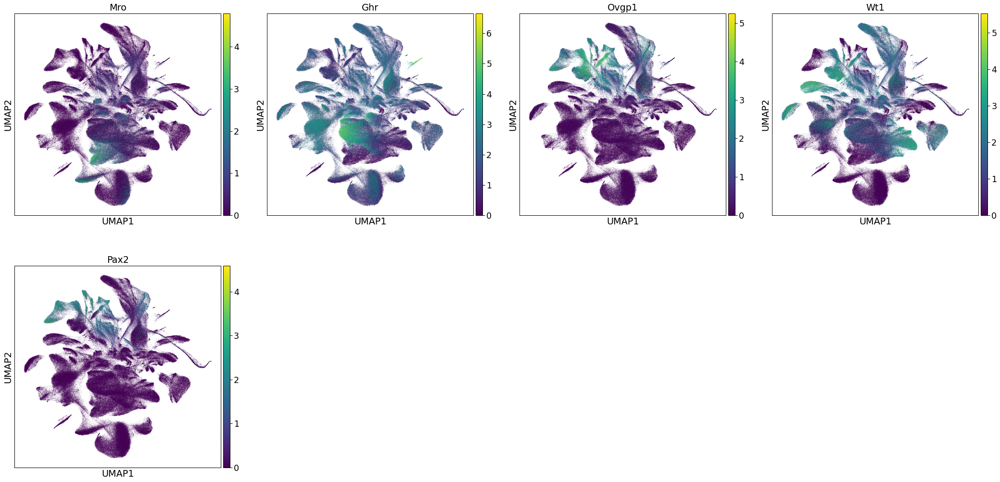

In [79]:
sc.pl.umap(adata, color=['Mro','Ghr','Ovgp1','Wt1','Pax2'], size = 0.8, palette = plate_palette)


In [80]:
old_annots = pd.read_csv(f'../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv')
old_annots['subpool'] = old_annots['subpool'].str.replace(r'Sublibrary_(\d+)', r'Subpool_\1', regex=True)

subpool_mapping = {
    "13A": "Subpool_1",
    "13B": "Subpool_2",
    "13C": "Subpool_3",
    "13D": "Subpool_4",
    "13E": "Subpool_5",
    "13F": "Subpool_6",
    "13G": "Subpool_7",
    "13H": "Subpool_8"
}

# Update the subpool column for the specified plate
old_annots.loc[old_annots['plate'] == 'igvf_012', 'subpool'] = (
    old_annots['subpool'].map(subpool_mapping)
)


old_annots['cellID'] = old_annots['bc1_well'] + "_" + old_annots['bc2_well'] + "_" + old_annots['bc3_well'] + "_" + old_annots['subpool']  + "_" + old_annots['plate'] 



/tmp/ipykernel_1900493/134062919.py:1: DtypeWarning: Columns (12,13,31,36,37,40,41,42) have mixed types. Specify dtype option on import or set low_memory=False.
  old_annots = pd.read_csv(f'../IGVF_analysis/annotated_tissues/{tissue}_annotated_metadata.csv')


In [81]:
new_cells = adata.obs.index.tolist()
old_cells = old_annots['cellID'].tolist()

new_cells_series = pd.Series(new_cells)
old_cells_series = pd.Series(old_cells)


old_in_new = old_cells_series.isin(new_cells)
new_in_old = new_cells_series.isin(old_cells)


old_not_in_new = old_cells_series[~old_in_new]
new_not_in_old = new_cells_series[~new_in_old]

print(f"Number of old_cells not in new_cells: {len(old_not_in_new)}")

print(f"Number of new_cells not in old_cells: {len(new_not_in_old)}")


Number of old_cells not in new_cells: 28683
Number of new_cells not in old_cells: 85168


In [82]:
old_annots.set_index('cellID', inplace=True)
transfer_df = old_annots[['subtype', 'celltype']]

adata_obs = adata.obs.copy()

# Merge the dataframes, adding the 'subtype' and 'celltype' columns to adata.obs
adata_obs = adata_obs.join(transfer_df, how='left')


In [83]:
# Ensure missing values are explicitly set as NA
adata_obs['subtype'].fillna(value="NA", inplace=True)
adata_obs['celltype'].fillna(value="NA", inplace=True)

In [84]:
adata_obs.head()

,lab_sample_id,sample,plate,subpool,SampleType,Tissue,Sex,Age,Genotype,subpool_type,...,doublet_score,predicted_doublet,background_fraction,cell_probability,cell_size,droplet_efficiency,leiden,leiden_R,subtype,celltype
cellID,,,,,,,,,,,,,,,,,,,,,
F7_D10_A1_Subpool_4_igvf_008b,094_CASTJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,CASTJ,NO,...,0.113703,False,0.000564,0.999955,59862.667969,2.5,25,25,endothelial cell,endothelial cell
C5_C12_A7_Subpool_4_igvf_008b,030_AJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,AJ,NO,...,0.128940,False,0.000316,0.999955,58552.738281,2.5,22,22,luteal cell,luteal cell
D1_C12_A12_Subpool_4_igvf_008b,076_PWKJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,PWKJ,NO,...,0.076923,False,0.000479,0.999955,53721.480469,2.5,18,18,endothelial cell,endothelial cell
E5_G9_B3_Subpool_4_igvf_008b,040_129S1J_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,129S1J,NO,...,0.142857,False,0.000120,0.999955,50204.941406,2.5,35,35,NA,NA
B3_E2_A4_Subpool_4_igvf_008b,068_NODJ_10F_26,NA,igvf_008b,Subpool_4,Nuclei,GonadsFemale,Female,PNM_02,NODJ,NO,...,0.161765,False,0.000531,0.999955,50023.472656,2.5,12,12,ciliated epithelial cell,ciliated epithelial cell


In [85]:
adata.obs['celltype_carryover'] = adata_obs['celltype']
adata.obs['subtype_carryover'] = adata_obs['subtype']

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


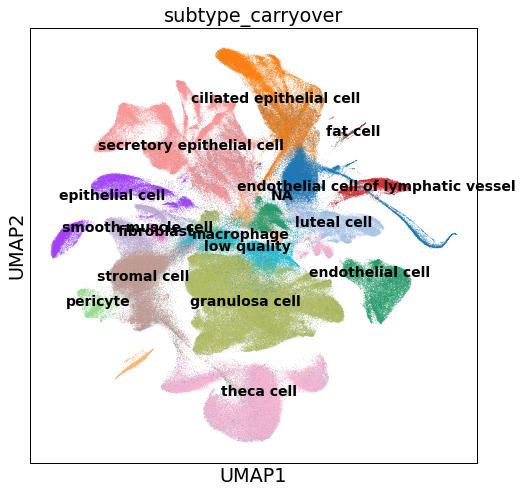

In [86]:
sc.pl.umap(adata, color=['subtype_carryover'], size = 1, legend_fontsize = 14, legend_loc = "on data")


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


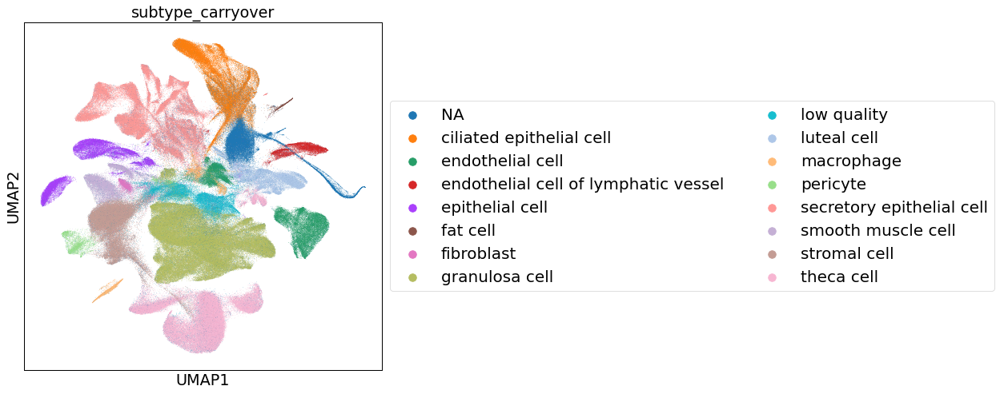

In [87]:
# Plot UMAP
ax = sc.pl.umap(adata, color=['subtype_carryover'], size=1, legend_fontsize=20, show=False)
handles, labels = ax.get_legend_handles_labels()
plt.legend(handles, labels, loc='center left', bbox_to_anchor=(1, 0.5), markerscale=2, fontsize=20, ncol=2)
plt.show()

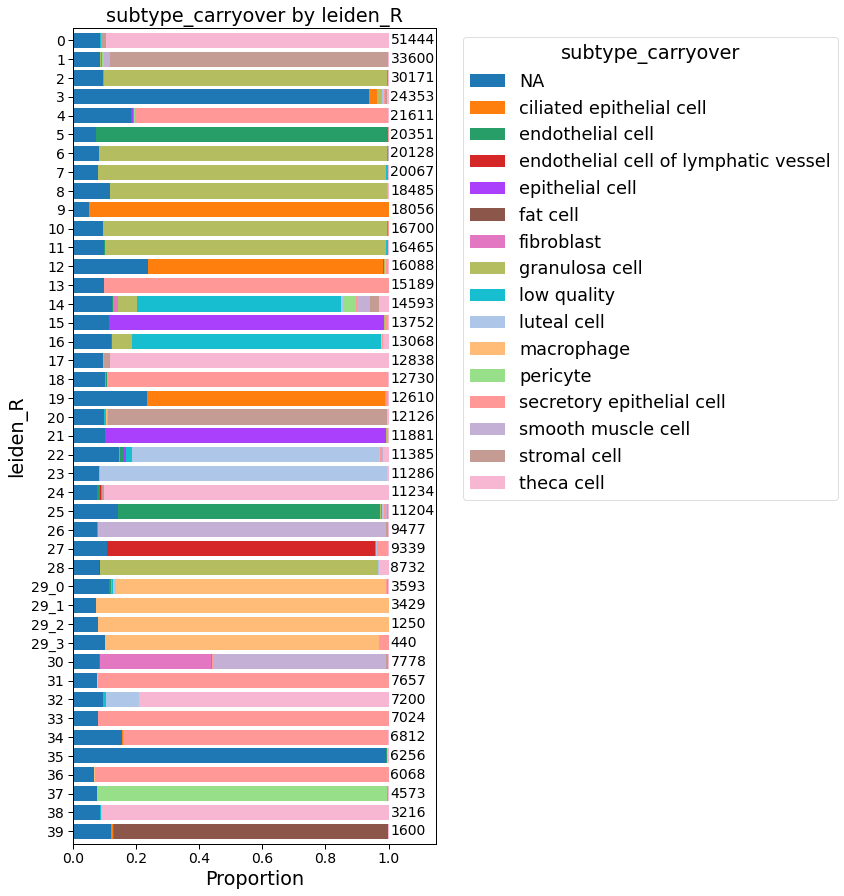

In [88]:
stacked_barplot_proportions(adata.obs, 
                            'leiden_R', 'subtype_carryover',
                            reverse_order = True,
                            custom_colors = adata.uns["subtype_carryover_colors"],
                            fsize = (6.5,15), 
                            annotations = True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


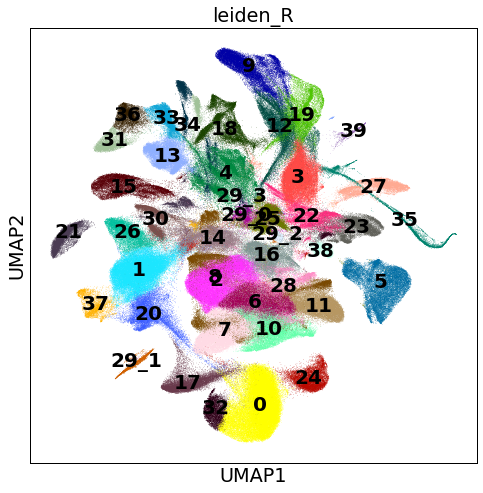

In [89]:
sc.pl.umap(adata, color=['leiden_R'], size=1, legend_fontsize = 20, legend_loc = 'on data')


In [90]:
adata.uns['log1p']["base"] = None # probably have to run this line, known scanpy bug.. https://github.com/scverse/scanpy/issues/2239#issuecomment-1104178881 


In [91]:
sc.tl.rank_genes_groups(adata, groupby="leiden_R", method="t-test")


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:394: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'names'] = self.var_names[global_indices]
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:396: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  self.stats[group_name, 'scores'] = scores[global_indices]
/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/tools/_rank_genes_groups.py:399: PerformanceWarning: DataFrame is highly fragme

/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


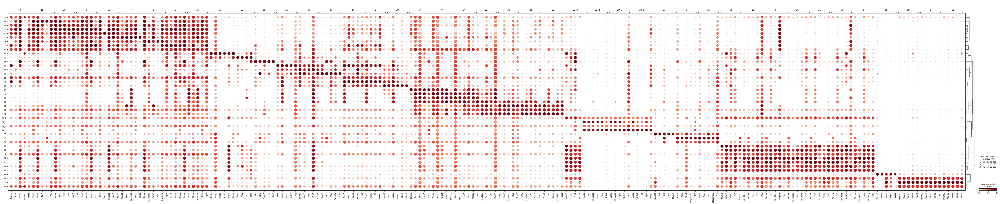

In [92]:
sc.pl.rank_genes_groups_dotplot(
    adata, groupby="leiden_R", standard_scale="var", n_genes=5
)

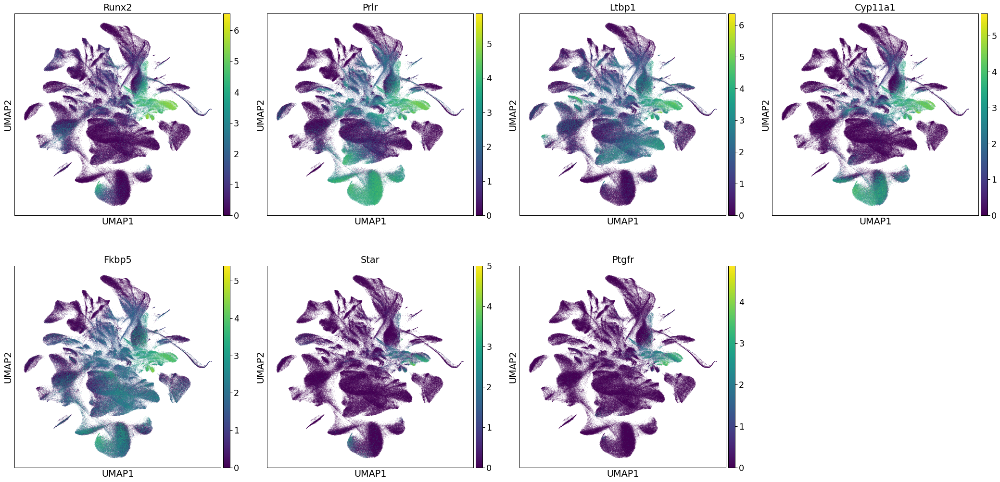

In [93]:
sc.pl.umap(adata, color=['Runx2','Prlr','Ltbp1','Cyp11a1','Fkbp5','Star','Ptgfr'], size = 0.8, palette = plate_palette)


# Annotate

In [118]:
annots = pd.read_csv("post_cellbender_annotations.csv")
annots = annots[annots['tissue'] == tissue]
annots['leiden_R'] = annots['leiden_R'].astype(str)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['general_celltype'].to_dict()
adata.obs['general_celltype'] = adata.obs['leiden_R'].map(annotation_dict)
annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['general_CL_ID'].to_dict()
adata.obs['general_CL_ID'] = adata.obs['leiden_R'].map(annotation_dict)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['celltype'].to_dict()
adata.obs['celltype'] = adata.obs['leiden_R'].map(annotation_dict)
annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['CL_ID'].to_dict()
adata.obs['CL_ID'] = adata.obs['leiden_R'].map(annotation_dict)

annotation_dict = annots.groupby('leiden_R').head(1).set_index('leiden_R')['subtype'].to_dict()
adata.obs['subtype'] = adata.obs['leiden_R'].map(annotation_dict)



/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


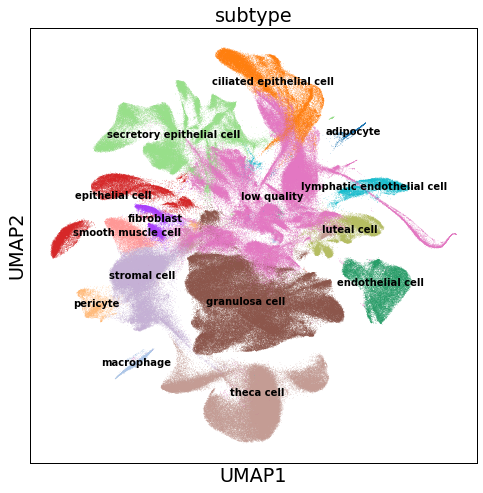

In [119]:
sc.pl.umap(adata, color=['subtype'], size=1, legend_fontsize = 10, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


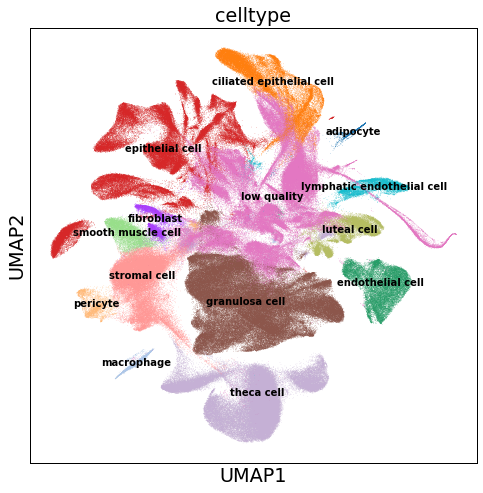

In [120]:
sc.pl.umap(adata, color=['celltype'], size=1, legend_fontsize = 10, legend_loc = 'on data')


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


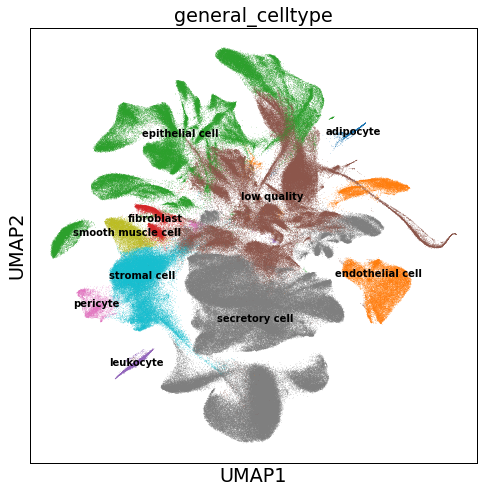

In [121]:
sc.pl.umap(adata, color=['general_celltype'], size=1, legend_fontsize = 10, legend_loc = 'on data')


In [122]:
# adata.obs.drop(columns='celltype_carryover', inplace=True)
# adata.obs.drop(columns='subtype_carryover', inplace=True)


In [124]:
meta = adata.obs
meta.to_csv(f"../IGVF_analysis/cellbender_tissues/obs_tables/{tissue}_annotated_metadata.csv")


In [125]:
adata.write_h5ad(f'../IGVF_analysis/cellbender_tissues/{tissue}_annotated.h5ad')


In [4]:
adata = sc.read_h5ad(f'../IGVF_analysis/cellbender_tissues/annotated/{tissue}_annotated.h5ad')


In [5]:
plt.rcParams['figure.figsize'] = (8, 8)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:392: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


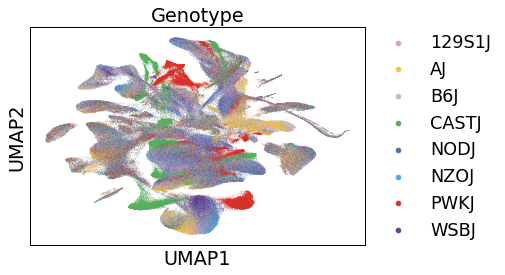

In [6]:
plate_palette = sns.color_palette("husl", n_colors=3)
sex_palette = ['hotpink','dodgerblue']
geno_palette = ['#DA9CC1', '#F4C245', '#C0BFBF', '#55AF5B', '#4F6EAF', '#52A5DB', '#D83026', '#683C91']

sc.pl.umap(adata, color='Genotype', size = 0.8, palette = geno_palette)


In [9]:
adata.obs['subtype_genotype'] = adata.obs['subtype'].astype(str) + "_" + adata.obs['Genotype'].astype(str)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


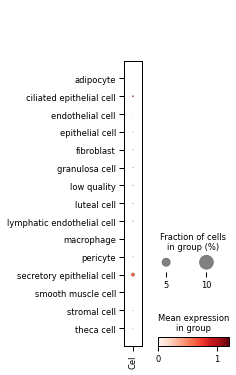

In [14]:
sc.pl.dotplot(adata, ['Cel'], 'subtype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


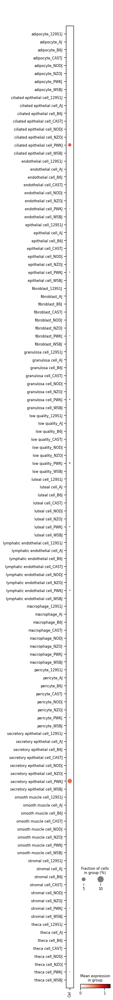

In [12]:
sc.pl.dotplot(adata, ['Cel'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


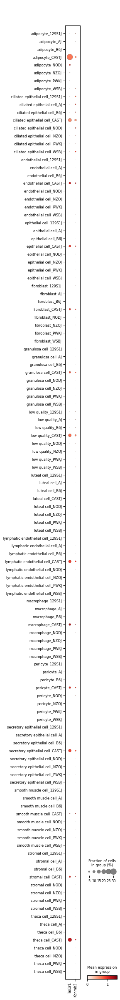

In [10]:
sc.pl.dotplot(adata, ['Tas1r1','Kcnmb3'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


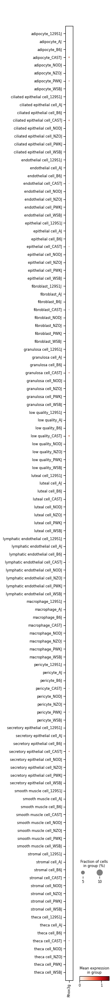

In [13]:
sc.pl.dotplot(adata, ['Rhox3g'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)


/opt/apps/python/3.8.0/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


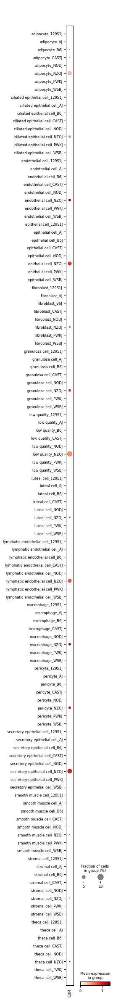

In [11]:
sc.pl.dotplot(adata, ['Gjb4'], 'subtype_genotype', mean_only_expressed = True,
              dendrogram=False, log=True)
